<h1> NATURAL LANGUAGE PROCESSING </h1>
<blockquote>
    <b> Project Description</b> <br>In this notebook I'll be looking at the priorities, challenges and the focus points faced over time by various presidents of South Africa dating back to 2000. Based on their state of the nation address speeches.
</blockquote>

In [1]:
import requests
from bs4 import BeautifulSoup
import pickle
import pandas as pd
import re
import string
from sklearn.feature_extraction.text import CountVectorizer
from collections import Counter
from sklearn.feature_extraction import text 
from wordcloud import WordCloud
import matplotlib.pyplot as plt
from textblob import TextBlob
import numpy as np
import math
from readability import Readability
import nltk
from nltk.stem import WordNetLemmatizer 
import seaborn as sns
sns.set()

<h2> Getting the data </h2>

In [2]:
def url_to_transcript(url):
    page = requests.get(url).text
    soup = BeautifulSoup(page, "html.parser")
    text = [p.text for p in soup.find(class_="section-content").find_all('p')]
    return text

urls = ['https://www.gov.za/node/537668',
        'https://www.gov.za/node/537670',
        'https://www.gov.za/node/537672',
        'https://www.gov.za/node/538218',
        'https://www.gov.za/node/537677',
        'https://www.gov.za/node/537680',
        'https://www.gov.za/node/537683',
        'https://www.gov.za/node/537686',
        'https://www.gov.za/t-mbeki-state-nation-address',        
        'https://www.gov.za/node/537711',
        'https://www.gov.za/node/537724',       
        'https://www.gov.za/state-nation-address-his-excellency-jg-zuma-president-republic-south-africa-joint-sitting-parliament',
        'https://www.gov.za/node/537766',        
        'https://www.gov.za/state-nation-address-his-excellency-jacob-g-zuma-president-republic-south-africa-joint-sitting-1',
        'https://www.gov.za/node/538324',       
        'https://www.gov.za/node/537825',
        'https://www.gov.za/node/632440',
        'https://www.gov.za/state-nation-address-his-excellency-jacob-g-zuma-president-republic-south-africa-occasion-june-2014',
        'https://www.gov.za/president-jacob-zuma-state-nation-address-2015',
        'https://www.gov.za/speeches/president-jacob-zuma-state-nation-address-2016-11-feb-2016-0000',
        'https://www.gov.za/speeches/president-jacob-zuma-2017-state-nation-address-9-feb-2017-0000',
        'https://www.gov.za/speeches/president-cyril-ramaphosa-2018-state-nation-address-16-feb-2018-0000',        
        'https://www.gov.za/speeches/president-cyril-ramaphosa-2019-state-nation-address-7-feb-2019-0000',
        'https://www.gov.za/speeches/2SONA2019',
        'https://www.gov.za/speeches/president-cyril-ramaphosa-2020-state-nation-address-13-feb-2020-0000',
        'https://www.gov.za/speeches/president-cyril-ramaphosa-2021-state-nation-address-11-feb-2021-0000',]


years = ['2000','2001','2002','2003','2004','2004.1','2005','2006','2007','2008','2009','2009.1','2010',
         '2011','2012','2013','2014','2014.1','2015','2016','2017','2018','2019','2019.1','2020','2021']

        

In [3]:
transcripts = [url_to_transcript(u) for u in urls]

<blockquote>
The contents of the State of the Nation Address (SONA) for every year dating back to 1990 is available on the South African Government website. I scraped the contents of each. The SONA usually happens once a year unless there's an election then it happens twice. In that case for the each year there was an election there are two speeches. I pickle them so that I'm able to use them later.
</blockquote>

In [4]:
for i, c in enumerate(years):
     with open("data/" + c + ".txt", "wb") as file:
         pickle.dump(transcripts[i], file)

In [5]:
data = {}
for i, c in enumerate(years):
    with open("data/" + c + ".txt", "rb") as file:
        data[c] = pickle.load(file)

<h2>Cleaning the Data</h2>

In [6]:
def combine_text(list_of_text):
    combined_text = ' '.join(list_of_text)
    return combined_text

In [7]:
data_combined = {key: [combine_text(value)] for (key, value) in data.items()}

<blockquote>
 <li> Our dictionary is was in key: year, value: list of text format.</li>
 <li> I changed that to  key: year, value: string format</li>
</blockquote>

<h3>1. Create a corpus from the English-language text for the SONAs dating back to 2000. Save them with the speaker information and date for later analysis. Where there is more than one SONA per year, get both. </h3>

In [8]:
pd.set_option('max_colwidth',150)

data_df = pd.DataFrame.from_dict(data_combined).transpose()
data_df.columns = ['transcript']
data_df = data_df.sort_index()

In [9]:
presidents = ['Thabo Mbeki', 'Thabo Mbeki', 'Thabo Mbeki', 'Thabo Mbeki', 'Thabo Mbeki', 'Thabo Mbeki',
              'Thabo Mbeki', 'Thabo Mbeki', 'Thabo Mbeki', 'Thabo Mbeki', 'Kgalema Motlanthe', 'Jacob Zuma',
              'Jacob Zuma', 'Jacob Zuma', 'Jacob Zuma', 'Jacob Zuma', 'Jacob Zuma', 'Jacob Zuma',
              'Jacob Zuma', 'Jacob Zuma', 'Jacob Zuma', 'Cyril Ramaphosa', 'Cyril Ramaphosa', 'Cyril Ramaphosa',
              'Cyril Ramaphosa', 'Cyril Ramaphosa']

data_df['presidents'] = presidents

In [10]:
def clean_text(text):
    '''Get rid of punctuation, numbers and non-sensical text.'''
    text = text.lower()
    text = re.sub('\[.*?\]', '', text)
    text = re.sub('[%s]' % re.escape(string.punctuation), '', text)
    text = re.sub('\w*\d\w*', '', text)
    text = re.sub('[‘’“”…]', '', text)
    text = re.sub('\n', '', text)
    return text

In [11]:
data_clean = pd.DataFrame(data_df.transcript.apply(clean_text))

In [12]:
lemmatizer = WordNetLemmatizer()
data_clean.transcript = data_clean.transcript.apply(lambda x:' '.join([lemmatizer.lemmatize(w) for w in nltk.word_tokenize(x)]))

In [13]:
data_presidents = data_clean.copy()
data_clean.head()

,transcript
2000,madame speaker and deputy speakerchairperson and deputy chairperson of the ncophonourable member of our national legislaturepresident of the const...
2001,madame speaker and deputy speakerdeputy president jacob zumachairperson and deputy chairperson of the ncoppresident mandela and mr machelhonourabl...
2002,madame speaker and deputy speakerchairperson and deputy chairperson of the ncophonourable member of our national parliamentministers and deputy mi...
2003,madame speaker of the national assemblychairperson of the national council of provincesdeputy speaker and deputy chairperson of the national house...
2004,february madame speakerchairperson of the national council of provincesdeputy speaker and deputy chairperson of the national house of parliamentde...


In [14]:
data_presidents['presidents'] = presidents
data_presidents.set_index('presidents',inplace=True)
data_presidents.head()

,transcript
presidents,
Thabo Mbeki,madame speaker and deputy speakerchairperson and deputy chairperson of the ncophonourable member of our national legislaturepresident of the const...
Thabo Mbeki,madame speaker and deputy speakerdeputy president jacob zumachairperson and deputy chairperson of the ncoppresident mandela and mr machelhonourabl...
Thabo Mbeki,madame speaker and deputy speakerchairperson and deputy chairperson of the ncophonourable member of our national parliamentministers and deputy mi...
Thabo Mbeki,madame speaker of the national assemblychairperson of the national council of provincesdeputy speaker and deputy chairperson of the national house...
Thabo Mbeki,february madame speakerchairperson of the national council of provincesdeputy speaker and deputy chairperson of the national house of parliamentde...


<blockquote>
<li> Thereafter I made all the text lowercase, removed text in square brackets, punctuation and words containing numbers.</li>
</blockquote>

<h3>2. Use NLTK to create a document-term matrix from the text</h3>

In [15]:
def document_matrix(df):
    cv = CountVectorizer(stop_words='english')
    data_cv = cv.fit_transform(df.transcript)
    data_dtm = pd.DataFrame(data_cv.toarray(), columns=cv.get_feature_names())
    data_dtm.index = df.index
    return data_dtm

<blockquote>
I've decided the tokenize by data by breaking down the text into words. To do this I made use of scikit-learn's CountVectorizer, where every row will represent a different document and every column will represent a different word.
After that I pickled that data for later use. In addition, with CountVectorizer, we can remove stop words. Stop words are common words that add no additional meaning to text such as 'a', 'the', etc. So I've removed those.


</blockquote>

In [16]:
data_dtm = document_matrix(data_clean)
data_president = document_matrix(data_presidents)

In [17]:
data_dtm = data_dtm.transpose()
data_president = data_president.groupby(presidents).sum().transpose()

<blockquote>
<h3>3. Examine the most frequently used terms in each speech. You may need to add additional stop words that are said very often, such as “South Africa” and “country”. If a word occurs in the top 10 words in each SONA, add it to the stop words list.</h3>
</blockquote>

In [18]:
top_dict = {}
for column in data_dtm.columns:
    top = data_dtm[column].sort_values(ascending=False).head(30)
    top_dict[column]= list(zip(top.index, top.values))

<blockquote>
    Here I'm looking at the top 30 words said during each speech.
    </blockquote>

In [19]:
for year, top_words in top_dict.items():
    print(year)
    print(', '.join([word for word, count in top_words[0:14]]))
    print('---')

2000
government, year, people, ha, country, work, ensure, economic, development, sector, important, international, growth, continue
---
2001
government, country, sector, african, year, people, development, area, programme, new, ha, south, service, past
---
2002
year, government, people, programme, south, ha, country, work, african, economic, development, africa, society, service
---
2003
government, people, year, development, work, country, ha, african, world, social, national, programme, regard, sector
---
2004
people, government, country, decade, wa, said, new, mandela, ensure, mass, human, frontier, society, development
---
2004.1
development, year, government, work, people, national, regard, programme, continue, process, ensure, world, country, improve
---
2005
year, government, south, africa, programme, service, people, regard, ha, ensure, development, public, african, work
---
2006
people, government, country, year, development, ha, programme, national, nation, world, ensure, gro

<blockquote>
    Here I'm looking at the top 15 words said during each speech. <br> After looking at these top words, you can see that some of them have very little meaning and could be added to a stop words list, so I'm going to do that.
 </blockquote>

In [20]:
words = []
for year in data_dtm.columns:
    top = [word for (word, count) in top_dict[year]]
    for t in top:
        words.append(t)

In [21]:
Counter(words).most_common()

[('government', 26),
 ('year', 26),
 ('country', 26),
 ('people', 25),
 ('development', 25),
 ('ha', 24),
 ('work', 24),
 ('south', 24),
 ('african', 24),
 ('national', 23),
 ('sector', 21),
 ('africa', 21),
 ('programme', 20),
 ('economic', 19),
 ('public', 18),
 ('ensure', 15),
 ('economy', 14),
 ('new', 14),
 ('service', 13),
 ('growth', 12),
 ('continue', 12),
 ('social', 11),
 ('regard', 10),
 ('honourable', 9),
 ('world', 9),
 ('job', 9),
 ('million', 9),
 ('business', 9),
 ('state', 9),
 ('wa', 8),
 ('investment', 7),
 ('community', 7),
 ('need', 7),
 ('plan', 7),
 ('improve', 6),
 ('opportunity', 6),
 ('poverty', 5),
 ('process', 5),
 ('nation', 5),
 ('challenge', 5),
 ('local', 5),
 ('member', 5),
 ('support', 5),
 ('area', 4),
 ('better', 4),
 ('life', 4),
 ('security', 4),
 ('land', 4),
 ('working', 4),
 ('project', 4),
 ('compatriot', 4),
 ('infrastructure', 4),
 ('water', 4),
 ('speaker', 3),
 ('chairperson', 3),
 ('crime', 3),
 ('society', 3),
 ('time', 3),
 ('president',

In [22]:
add_stop_words = [word for word, count in Counter(words).most_common() if count > 6]

<blockquote>
I looked at the most common top words and added them to the stop word list. Fisrt I pulled out the top 30 words for each speech. Then I aggregated that list to identify the most common words along with how many speeches they occur in. If more than half of the speeches had it as a top word, I'm going to remove it.
</blockquote>

In [23]:
stop_words = text.ENGLISH_STOP_WORDS.union(add_stop_words)

def count_vectorize(df):
    cv = CountVectorizer(stop_words=stop_words)
    data_cv = cv.fit_transform(df.transcript)
    data_stop = pd.DataFrame(data_cv.toarray(), columns=cv.get_feature_names())
    data_stop.index = df.index
    return data_stop

In [24]:
data_stop = count_vectorize(data_clean).transpose()
data_president = count_vectorize(data_presidents).groupby(presidents).sum().transpose()

<blockquote>
I've updated the document matrix by adding the new stop words. 
</blockquote>

<blockquote>
<h3> 4. How do the speeches compare in terms of complexity and length? How many speeches are there per president? On average, which presidents use the most unique words and which presidents use the most words? </h3>
</blockquote>

In [25]:
length = []
for transcript in data_df.transcript:
    length.append(transcript.count(' ')+1)

data_words = pd.DataFrame(list(zip(presidents, length)), columns=['president', 'average_words'])
data_unique_sort = data_words.sort_values(by='average_words',ascending=False)
data_unique_sort.groupby('president').mean().sort_values(by=['average_words'],ascending=False)

,average_words
president,
Kgalema Motlanthe,7530.0
Thabo Mbeki,7114.4
Cyril Ramaphosa,7096.8
Jacob Zuma,5108.1


<blockquote>
Motlanthe, has the longest average number of words. However he only gave one speech. Former president Mbheki on average had the longest speeches.
</blockquote>

In [26]:
unique_list = []
for president in data_dtm.columns:
    uniques = data_dtm[president].to_numpy().nonzero()[0].size
    unique_list.append(uniques)

data_words = pd.DataFrame(list(zip(presidents, unique_list)), columns=['president', 'unique_words'])
data_unique_sort = data_words.sort_values(by='unique_words')
data_unique_sort.groupby('president').mean().sort_values(by=['unique_words'],ascending=False)

,unique_words
president,
Kgalema Motlanthe,1634.0
Cyril Ramaphosa,1541.2
Thabo Mbeki,1470.1
Jacob Zuma,1301.1


<blockquote>
Motlanthe on average used the most number of unique words, however he only gave one speech. Among the presidents who gave more than one speech Ramaphosa was the one who used the most unique words. Zuma on average had the shortest speeches and used the least number of unique words.
</blockquote>

In [27]:
data_unique_sort.president.value_counts()

Jacob Zuma           10
Thabo Mbeki          10
Cyril Ramaphosa       5
Kgalema Motlanthe     1
Name: president, dtype: int64

<blockquote>
Above we can see the number of speeches made by each president.

</blockquote>

In [28]:
grade_level = []
for speech in data_df.transcript:
    read = Readability(speech)
    flesch_kin = read.flesch_kincaid()
    grade_level.append(flesch_kin.grade_level)
    
    
data_words = pd.DataFrame(list(zip(presidents, grade_level)), columns=['president', 'grade_level'])
data_words = data_words.sort_values(by='grade_level', ascending= False)
data_words["grade_level"] = pd.to_numeric(data_words["grade_level"])
data_words.groupby('president').mean().sort_values(by=['president'],ascending=False)

,grade_level
president,
Thabo Mbeki,16.3
Kgalema Motlanthe,15.0
Jacob Zuma,13.8
Cyril Ramaphosa,13.4


<blockquote>
Here we determine the complexity of the speech by assigning a grade level for each. For example “Flesch-Kincaid Grade Level” score of 12 indicates a 12th grade reading level. 
From the above we can see that almost all of the speeches were above the reading level of a typical grade 12 learner. Thabo Mbeki gave the most complex speeches with Ramaphosa giving the simplest speeches.
</blockquote>

<blockquote>
    <h3>5. Create word clouds to visualise the speeches for each president. What are the main issues that they talked about during their presidency?
 </h3>
    </blockquote>

In [29]:
wc = WordCloud(stopwords=frozenset(list(stop_words)+['u','â' ]), background_color="white", colormap="Dark2",
               max_font_size=150, random_state=42)

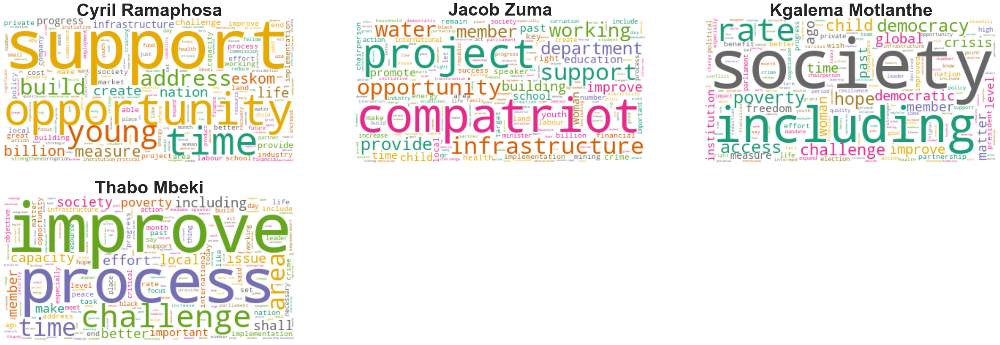

In [30]:
full_names = list(data_president.columns)
plt.subplots(figsize=(40, 65))

for index, president in enumerate(data_president.columns):
    wc.generate(data_presidents.groupby(presidents).sum().transcript[president])
    
    plt.subplot(9, 3, index+1)
    plt.imshow(wc, interpolation="bilinear")
    plt.axis("off")
    plt.title(full_names[index], fontsize=40, fontweight='bold')
plt.show()

<blockquote>
    By looking at these word clouds we can see some of the issues that each president mostly spoke about.<br>
    <b>Cyril Ramaphosa</b> focused mainly on supporting and creating opportunities for the youth.<br>
    <b>Jacob Zuma</b> focused mainly on creating opportunities and improving infrastructure.<br>
    <b>Kgalema Motlante</b> focused mainly on improving society, tackling issues like poverty and inclusivity.<br>
    <b>Thabo Mbeki</b> focused mainly on improving society, dealing with poverty and process running the country<br>
</blockquote>


<h3>6. Use TextBlob to do sentiment analysis of the SONAs. Get the polarity and subjectivity for each SONA and visualise the changes in polarity and subjectivity over time. Also create a graph of the average polarity and subjectivity by president. Do you notice any patterns?</h3>


In [31]:
text_df = data_presidents.groupby('presidents').sum()

In [32]:
pol = lambda x: TextBlob(x).sentiment.polarity
sub = lambda x: TextBlob(x).sentiment.subjectivity

text_df['polarity'] = text_df['transcript'].apply(pol)
text_df['subjectivity'] = text_df['transcript'].apply(sub)

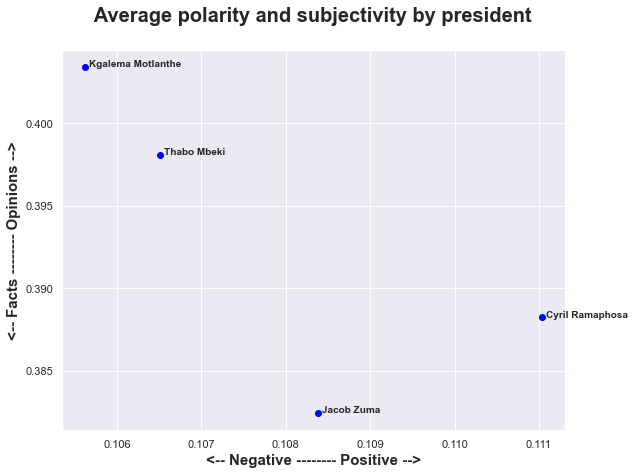

In [33]:
plt.rcParams['figure.figsize'] = [9, 7]

for index, president in enumerate(text_df.index):
    x = text_df.polarity.loc[president]
    y = text_df.subjectivity.loc[president]
    plt.scatter(x, y, color='blue')
    plt.text(x+.00005, y+.0, president, fontsize=10,fontweight='bold')

plt.title(' Average polarity and subjectivity by president \n', fontsize=20,fontweight='bold')
plt.xlabel('<-- Negative -------- Positive -->', fontsize=15,fontweight='bold')
plt.ylabel('<-- Facts -------- Opinions -->', fontsize=15,fontweight='bold')

plt.show()

<blockquote>
    Here I'm looking at:
    <li><b>Polarity:</b> How positive or negative a word is. -1 is very negative. +1 is very positive.</li>
    <li><b>Subjectivity:</b> How subjective, or opinionated a word is. 0 is fact. +1 is very much an opinion.</li>
    <b>Zuma and Ramaphosa</b> gave speeches stating many facts. Zuma's tone was neutral while Ramaphosas was generally positive. <b>Motlante and Mbheki</b> shared many opinions and didn't give speeches with a very positive tone.
</blockquote>

In [34]:
def split_text(text, n=10):
    length = len(text)
    size = math.floor(length / n)
    start = np.arange(0, length, size)
    
    split_list = []
    for piece in range(n):
        split_list.append(text[start[piece]:start[piece]+size])
    return split_list

<blockquote>
    Here I take in a string of text and splits into into equal parts, with a default of 10 equal parts.
</blockquote>

In [35]:
list_pieces = []
for t in data_df.transcript:
    split = split_text(t)
    list_pieces.append(split)

In [36]:
len(list_pieces)

26

In [37]:
len(list_pieces[0])

10

In [38]:
polarity_transcript = []
for lp in list_pieces:
    polarity_piece = []
    for p in lp:
        polarity_piece.append(TextBlob(p).sentiment.polarity)
    polarity_transcript.append(polarity_piece)

In [39]:
subjectivity_transcript = []
for lp in list_pieces:
    subjectivity_piece = []
    for p in lp:
        subjectivity_piece.append(TextBlob(p).sentiment.subjectivity)
    subjectivity_transcript.append(subjectivity_piece)

<blockquote>
Calculate the polarity for each piece of text
</blockquote>

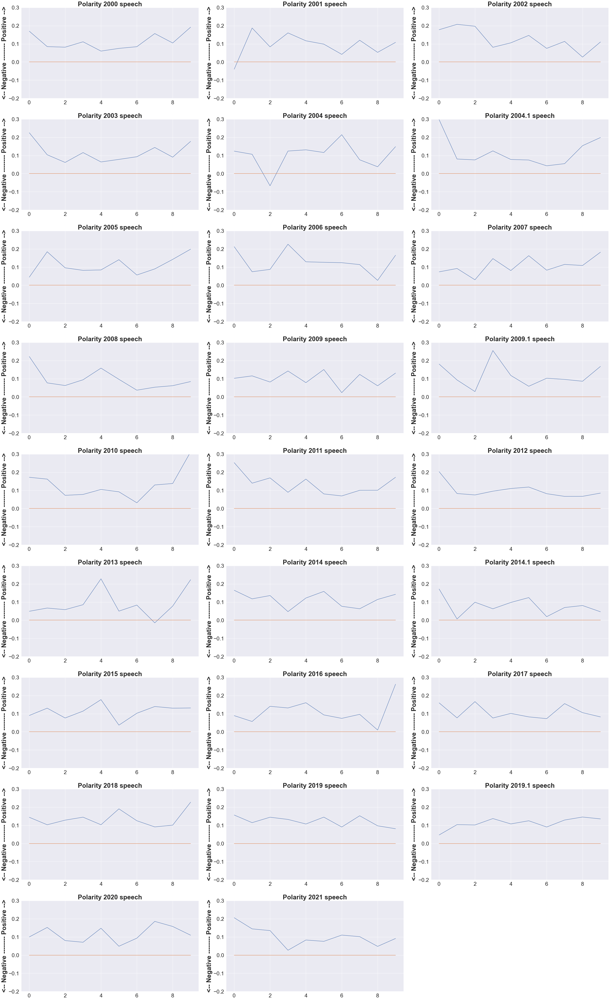

In [40]:
plt.subplots(figsize=(40, 65))
for index, year in enumerate(data_df.index):    
    plt.subplot(9, 3, index+1)
    plt.tight_layout(pad=3.0)
    plt.plot(polarity_transcript[index])
    plt.plot(np.arange(0,10), np.zeros(10))
    plt.title(f'Polarity {year} speech', fontsize=30, fontweight='bold')
    plt.ylabel('<-- Negative -------- Positive -->', fontsize=30, fontweight='bold')
    plt.ylim(ymin=-.2, ymax=.3)
    plt.xticks(fontsize=25)
    plt.yticks(fontsize=25)

plt.show()

<blockquote>
 Speeches are genenrally mildly positive, except for in 2001 and 2004 before elections when there was a negative tone for a part in each speech.
</blockquote>

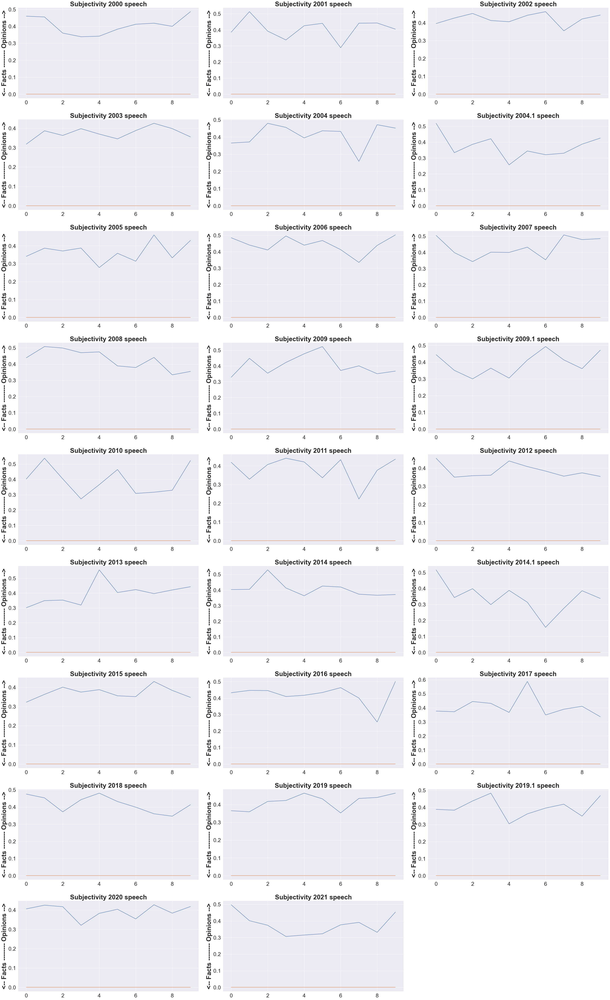

In [41]:
plt.subplots(figsize=(40, 65))
for index, year in enumerate(data_df.index):    
    plt.subplot(9, 3, index+1)
    plt.tight_layout(pad=3.0)
    plt.plot(subjectivity_transcript[index])
    plt.plot(np.arange(0,10), np.zeros(10))
    plt.title(f'Subjectivity {year} speech', fontsize=30, fontweight='bold')
    plt.ylabel('<-- Facts -------- Opinions -->', fontsize=30, fontweight='bold')
    plt.xticks(fontsize=25)
    plt.yticks(fontsize=25)

plt.show()

<blockquote>
 We can see that presidents generally like moderately sharing their opinions during speeches.
</blockquote>

<h3>
   7. How have focus areas and sentiment in the SONAs changed over the last twenty years in South Africa? Are there clear changes in focus areas between different presidents?
</h3>

In [42]:
wc = WordCloud(stopwords=frozenset(list(stop_words)+['u','â' ]), background_color="white", colormap="Dark2",
               max_font_size=150, random_state=42)

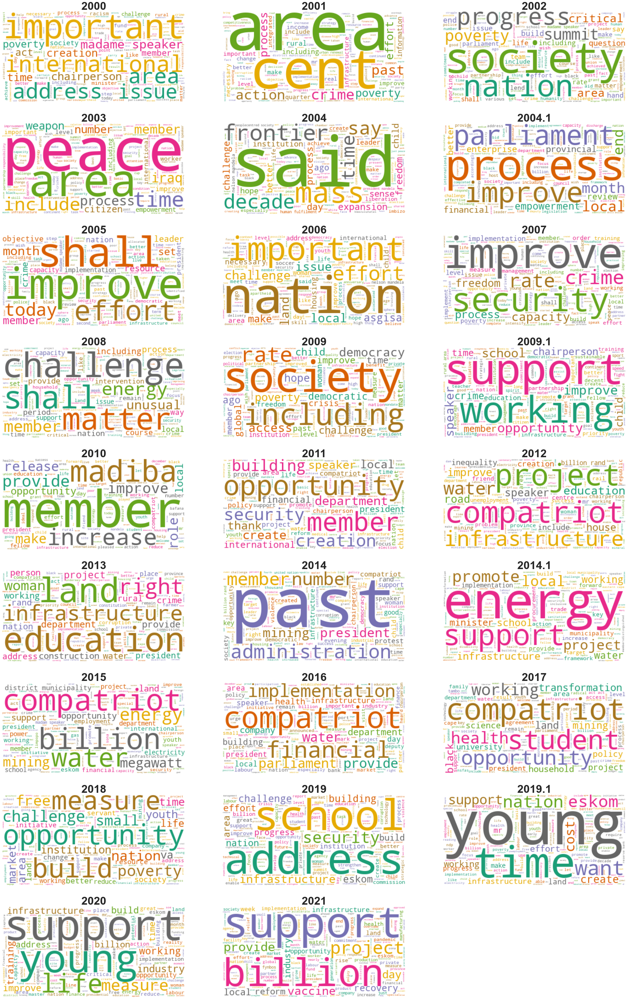

In [43]:
full_names = list(data.keys())
plt.subplots(figsize=(40, 65))

for index, year in enumerate(data_dtm.columns):
    wc.generate(data_clean.transcript[year])
    
    plt.subplot(9, 3, index+1)
    plt.imshow(wc, interpolation="bilinear")
    plt.axis("off")
    plt.title(full_names[index], fontsize=40, fontweight='bold')
plt.show()

<blockquote>
By looking at these word clouds we can get a general idea of the themes that emerged in the SONA speeches throughout the years.This gives us a great opportunity to look at the focus areas and how they have changed over time.
    <li>From <b>2000 - 2002 </b>we see poverty being a main theme. This could tell us that poverty was one of the challenges faced by the country that the government was focusing on addressing</li>
    <li><b>2003</b> we see the words peace, weapons and iraq. This could be refering to unrest in Iraq and how it affected South Africa.</li>
    <li><b>2004 - 2009</b> we see words like effort, security, progress, infrastructure. This could be refering to the efforts undertaken by the government to improve the infrastructure of our country and creating programmes to give people access to more opportunities </li>
    <li><b>2010</b> A big focal point in this speech is Nelson Mandela</li>
    <li><b>2011 - 2014</b>, here we see words like jobs, water, women, education and energy. This tell us that problems concerning water and electricity shortages, unemployment, quality of education and women empowerment were being faced</li>
    <li><b>2014 - 2016</b> a major theme here again is water and electricity shortage</li>
    <li><b>2017 - 2020</b> here we see words like youth, create, young, support students, job. This tells us that the major issues faced through out these years was youth unemployment.</li>
    <li><b>2021</b> billion, support and vaccine. It's obvious that theres reference to the corona virus pandemic and the need for financial support for all South Africans</li>
</blockquote>

In [44]:
data_df['polarity'] = data_df['transcript'].apply(pol)
data_df['subjectivity'] = data_df['transcript'].apply(sub)

In [45]:
def plot_graphs(x_axis,y_axis,title,y_label):
    plt.rcParams['figure.figsize'] = [20, 8]
    plt.figsize=(20,10)
    sns.lineplot(x=x_axis, y=y_axis, data=data_df)
    plt.title(f'{title} Over Time \n', fontsize=20, fontweight='bold')
    plt.xlabel('Year', fontsize=20, fontweight='bold')
    plt.ylabel(y_label, fontsize=20, fontweight='bold')
    plt.xticks(fontsize=13, fontweight='bold')
    plt.yticks(fontsize=13, fontweight='bold')
    plt.show()

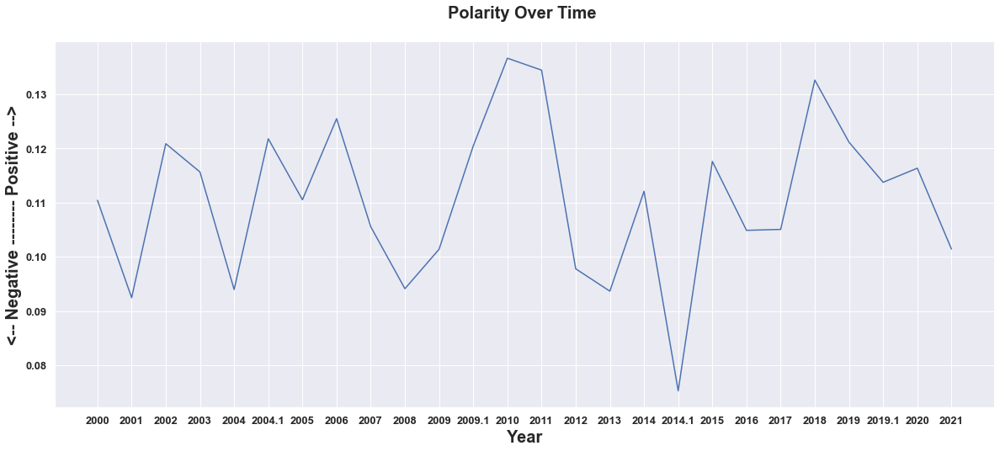

In [46]:
plot_graphs(data_df.index,'polarity','Polarity','<-- Negative -------- Positive -->')

<blockquote>
Speeches are generally moderately positive, 2014 had the least positive speech.
</blockquote>

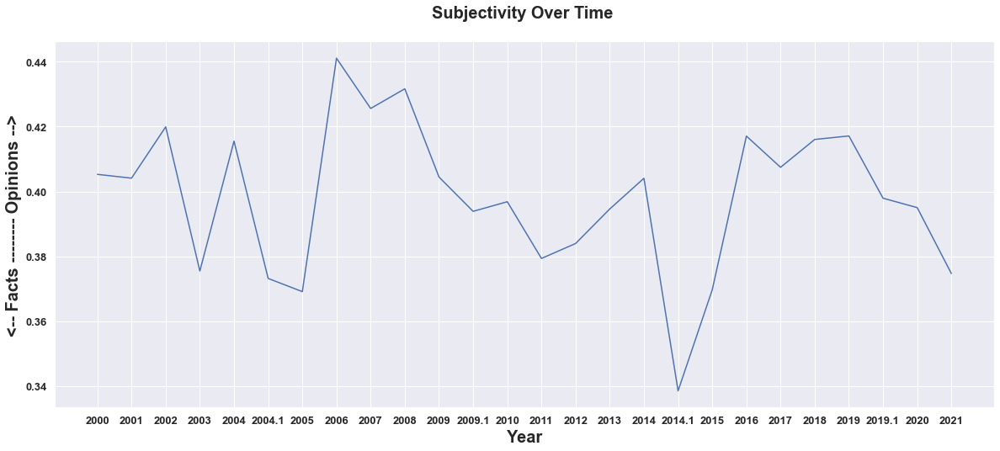

In [47]:
plot_graphs(data_df.index,'subjectivity','Subjectivity','<-- Facts -------- Opinions -->')

<blockquote>
 Presidents generally share a moderate amount of opinions. Interesting to note that the same speech in 2014 that was the least positive also had the most amount of facts.
</blockquote>